# Importing Libraries

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
import scipy.stats as stats

In [ ]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

# Open .csv File

In [ ]:
df=pd.read_csv(r'/content/car_insurance_claim.csv')
df.head(10)

,ID,KIDSDRIV,BIRTH,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,EDUCATION,OCCUPATION,TRAVTIME,CAR_USE,BLUEBOOK,TIF,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,CLAIM_FLAG,URBANICITY
0,63581743,0,16MAR39,60.0,0,11.0,"$67,349",No,$0,z_No,M,PhD,Professional,14,Private,"$14,230",11,Minivan,yes,"$4,461",2,No,3,$0,18.0,0,Highly Urban/ Urban
1,132761049,0,21JAN56,43.0,0,11.0,"$91,449",No,"$257,252",z_No,M,z_High School,z_Blue Collar,22,Commercial,"$14,940",1,Minivan,yes,$0,0,No,0,$0,1.0,0,Highly Urban/ Urban
2,921317019,0,18NOV51,48.0,0,11.0,"$52,881",No,$0,z_No,M,Bachelors,Manager,26,Private,"$21,970",1,Van,yes,$0,0,No,2,$0,10.0,0,Highly Urban/ Urban
3,727598473,0,05MAR64,35.0,1,10.0,"$16,039",No,"$124,191",Yes,z_F,z_High School,Clerical,5,Private,"$4,010",4,z_SUV,no,"$38,690",2,No,3,$0,10.0,0,Highly Urban/ Urban
4,450221861,0,05JUN48,51.0,0,14.0,NaN,No,"$306,251",Yes,M,<High School,z_Blue Collar,32,Private,"$15,440",7,Minivan,yes,$0,0,No,0,$0,6.0,0,Highly Urban/ Urban
5,743146596,0,17MAY49,50.0,0,NaN,"$114,986",No,"$243,925",Yes,z_F,PhD,Doctor,36,Private,"$18,000",1,z_SUV,no,"$19,217",2,Yes,3,$0,17.0,0,Highly Urban/ Urban
6,871024631,0,05MAY65,34.0,1,12.0,"$125,301",Yes,$0,z_No,z_F,Bachelors,z_Blue Collar,46,Commercial,"$17,430",1,Sports Car,no,$0,0,No,0,"$2,946",7.0,1,Highly Urban/ Urban
7,792300541,0,28FEB45,54.0,0,NaN,"$18,755",No,NaN,Yes,z_F,<High School,z_Blue Collar,33,Private,"$8,780",1,z_SUV,no,$0,0,No,0,$0,1.0,0,Highly Urban/ Urban
8,7945239,1,17SEP59,40.0,1,11.0,"$50,815",Yes,$0,z_No,M,z_High School,Manager,21,Private,"$18,930",6,Minivan,no,"$3,295",1,No,2,"$6,477",1.0,1,Highly Urban/ Urban
9,3577610,0,21AUG55,44.0,2,12.0,"$43,486",Yes,$0,z_No,z_F,z_High School,z_Blue Collar,30,Commercial,"$5,900",10,z_SUV,no,$0,0,No,0,$0,10.0,0,z_Highly Rural/ Rural


In [ ]:
df.isnull().sum()

,0
ID,0
KIDSDRIV,0
BIRTH,0
AGE,7
HOMEKIDS,0
YOJ,548
INCOME,570
PARENT1,0
HOME_VAL,575
MSTATUS,0


# Removing Unnecessary Columns

In [ ]:
df.drop(columns=["CLAIM_FLAG","BLUEBOOK"],axis=1,inplace=True)

In [ ]:
df.head()

,ID,KIDSDRIV,BIRTH,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,EDUCATION,OCCUPATION,TRAVTIME,CAR_USE,TIF,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,URBANICITY
0,63581743,0,16MAR39,60.0,0,11.0,"$67,349",No,$0,z_No,M,PhD,Professional,14,Private,11,Minivan,yes,"$4,461",2,No,3,$0,18.0,Highly Urban/ Urban
1,132761049,0,21JAN56,43.0,0,11.0,"$91,449",No,"$257,252",z_No,M,z_High School,z_Blue Collar,22,Commercial,1,Minivan,yes,$0,0,No,0,$0,1.0,Highly Urban/ Urban
2,921317019,0,18NOV51,48.0,0,11.0,"$52,881",No,$0,z_No,M,Bachelors,Manager,26,Private,1,Van,yes,$0,0,No,2,$0,10.0,Highly Urban/ Urban
3,727598473,0,05MAR64,35.0,1,10.0,"$16,039",No,"$124,191",Yes,z_F,z_High School,Clerical,5,Private,4,z_SUV,no,"$38,690",2,No,3,$0,10.0,Highly Urban/ Urban
4,450221861,0,05JUN48,51.0,0,14.0,NaN,No,"$306,251",Yes,M,<High School,z_Blue Collar,32,Private,7,Minivan,yes,$0,0,No,0,$0,6.0,Highly Urban/ Urban


# Duplicate Removal

In [ ]:
df=df.drop_duplicates()

# Data Wrangling

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 10299 entries, 0 to 10301
Data columns (total 25 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   ID          10299 non-null  int64  
 1   KIDSDRIV    10299 non-null  int64  
 2   BIRTH       10299 non-null  object 
 3   AGE         10292 non-null  float64
 4   HOMEKIDS    10299 non-null  int64  
 5   YOJ         9751 non-null   float64
 6   INCOME      9729 non-null   object 
 7   PARENT1     10299 non-null  object 
 8   HOME_VAL    9724 non-null   object 
 9   MSTATUS     10299 non-null  object 
 10  GENDER      10299 non-null  object 
 11  EDUCATION   10299 non-null  object 
 12  OCCUPATION  9635 non-null   object 
 13  TRAVTIME    10299 non-null  int64  
 14  CAR_USE     10299 non-null  object 
 15  TIF         10299 non-null  int64  
 16  CAR_TYPE    10299 non-null  object 
 17  RED_CAR     10299 non-null  object 
 18  OLDCLAIM    10299 non-null  object 
 19  CLM_FREQ    10299 non-null  in

In [ ]:
df["DATE,BIRTH"]=df["BIRTH"].str[:2].astype(int)
df["MONTH,BIRTH"]=df["BIRTH"].str[2:5].astype(str)
df["YEAR,BIRTH"]=df["BIRTH"].str[5:].astype(int)
df.drop(columns=["BIRTH"],axis=1,inplace=True)
df.head()

,ID,KIDSDRIV,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,EDUCATION,OCCUPATION,TRAVTIME,CAR_USE,TIF,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,URBANICITY,"DATE,BIRTH","MONTH,BIRTH","YEAR,BIRTH"
0,63581743,0,60.0,0,11.0,"$67,349",No,$0,z_No,M,PhD,Professional,14,Private,11,Minivan,yes,"$4,461",2,No,3,$0,18.0,Highly Urban/ Urban,16,MAR,39
1,132761049,0,43.0,0,11.0,"$91,449",No,"$257,252",z_No,M,z_High School,z_Blue Collar,22,Commercial,1,Minivan,yes,$0,0,No,0,$0,1.0,Highly Urban/ Urban,21,JAN,56
2,921317019,0,48.0,0,11.0,"$52,881",No,$0,z_No,M,Bachelors,Manager,26,Private,1,Van,yes,$0,0,No,2,$0,10.0,Highly Urban/ Urban,18,NOV,51
3,727598473,0,35.0,1,10.0,"$16,039",No,"$124,191",Yes,z_F,z_High School,Clerical,5,Private,4,z_SUV,no,"$38,690",2,No,3,$0,10.0,Highly Urban/ Urban,5,MAR,64
4,450221861,0,51.0,0,14.0,NaN,No,"$306,251",Yes,M,<High School,z_Blue Collar,32,Private,7,Minivan,yes,$0,0,No,0,$0,6.0,Highly Urban/ Urban,5,JUN,48


In [ ]:
df["YEAR,BIRTH"]=df["YEAR,BIRTH"].astype(str)
df["YEAR,BIRTH"]="19"+df["YEAR,BIRTH"]
df["YEAR,BIRTH"]=df["YEAR,BIRTH"].astype(int)
df["YEAR,BIRTH"]

,"YEAR,BIRTH"
0,1939
1,1956
2,1951
3,1964
4,1948
5,1949
6,1965
7,1945
8,1959
9,1955


In [ ]:
df.head()

,ID,KIDSDRIV,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,EDUCATION,OCCUPATION,TRAVTIME,CAR_USE,TIF,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,URBANICITY,"DATE,BIRTH","MONTH,BIRTH","YEAR,BIRTH"
0,63581743,0,60.0,0,11.0,"$67,349",No,$0,z_No,M,PhD,Professional,14,Private,11,Minivan,yes,"$4,461",2,No,3,$0,18.0,Highly Urban/ Urban,16,MAR,1939
1,132761049,0,43.0,0,11.0,"$91,449",No,"$257,252",z_No,M,z_High School,z_Blue Collar,22,Commercial,1,Minivan,yes,$0,0,No,0,$0,1.0,Highly Urban/ Urban,21,JAN,1956
2,921317019,0,48.0,0,11.0,"$52,881",No,$0,z_No,M,Bachelors,Manager,26,Private,1,Van,yes,$0,0,No,2,$0,10.0,Highly Urban/ Urban,18,NOV,1951
3,727598473,0,35.0,1,10.0,"$16,039",No,"$124,191",Yes,z_F,z_High School,Clerical,5,Private,4,z_SUV,no,"$38,690",2,No,3,$0,10.0,Highly Urban/ Urban,5,MAR,1964
4,450221861,0,51.0,0,14.0,NaN,No,"$306,251",Yes,M,<High School,z_Blue Collar,32,Private,7,Minivan,yes,$0,0,No,0,$0,6.0,Highly Urban/ Urban,5,JUN,1948


In [ ]:
df['AGE']=df['AGE'].replace("nan","")
df['AGE']=df['AGE'].fillna(df['AGE'].mean())
df["AGE"]=df["AGE"].astype(int)
Q1 = df['AGE'].quantile(0.25)
Q3 = df['AGE'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

df = df[(df['AGE'] >= lower_bound) & (df['AGE'] <= upper_bound)]
df["AGE"]

,AGE
0,60
1,43
2,48
3,35
4,51
5,50
6,34
7,54
8,40
9,44


In [ ]:
df.head()

,ID,KIDSDRIV,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,EDUCATION,OCCUPATION,TRAVTIME,CAR_USE,TIF,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,URBANICITY,"DATE,BIRTH","MONTH,BIRTH","YEAR,BIRTH"
0,63581743,0,60,0,11.0,"$67,349",No,$0,z_No,M,PhD,Professional,14,Private,11,Minivan,yes,"$4,461",2,No,3,$0,18.0,Highly Urban/ Urban,16,MAR,1939
1,132761049,0,43,0,11.0,"$91,449",No,"$257,252",z_No,M,z_High School,z_Blue Collar,22,Commercial,1,Minivan,yes,$0,0,No,0,$0,1.0,Highly Urban/ Urban,21,JAN,1956
2,921317019,0,48,0,11.0,"$52,881",No,$0,z_No,M,Bachelors,Manager,26,Private,1,Van,yes,$0,0,No,2,$0,10.0,Highly Urban/ Urban,18,NOV,1951
3,727598473,0,35,1,10.0,"$16,039",No,"$124,191",Yes,z_F,z_High School,Clerical,5,Private,4,z_SUV,no,"$38,690",2,No,3,$0,10.0,Highly Urban/ Urban,5,MAR,1964
4,450221861,0,51,0,14.0,NaN,No,"$306,251",Yes,M,<High School,z_Blue Collar,32,Private,7,Minivan,yes,$0,0,No,0,$0,6.0,Highly Urban/ Urban,5,JUN,1948


In [ ]:
df["YOJ"].unique()

array([11., 10., 14., nan, 12.,  7.,  5.,  0., 13.,  9., 17.,  8., 15.,
       16.,  6., 18.,  4.,  3.,  2., 19.,  1.])

In [ ]:
df["YOJ"]=df["YOJ"].fillna(df["YOJ"].mean())
df["YOJ"]=df["YOJ"].astype(int)

In [ ]:
df.head()

,ID,KIDSDRIV,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,EDUCATION,OCCUPATION,TRAVTIME,CAR_USE,TIF,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,URBANICITY,"DATE,BIRTH","MONTH,BIRTH","YEAR,BIRTH"
0,63581743,0,60,0,11,"$67,349",No,$0,z_No,M,PhD,Professional,14,Private,11,Minivan,yes,"$4,461",2,No,3,$0,18.0,Highly Urban/ Urban,16,MAR,1939
1,132761049,0,43,0,11,"$91,449",No,"$257,252",z_No,M,z_High School,z_Blue Collar,22,Commercial,1,Minivan,yes,$0,0,No,0,$0,1.0,Highly Urban/ Urban,21,JAN,1956
2,921317019,0,48,0,11,"$52,881",No,$0,z_No,M,Bachelors,Manager,26,Private,1,Van,yes,$0,0,No,2,$0,10.0,Highly Urban/ Urban,18,NOV,1951
3,727598473,0,35,1,10,"$16,039",No,"$124,191",Yes,z_F,z_High School,Clerical,5,Private,4,z_SUV,no,"$38,690",2,No,3,$0,10.0,Highly Urban/ Urban,5,MAR,1964
4,450221861,0,51,0,14,NaN,No,"$306,251",Yes,M,<High School,z_Blue Collar,32,Private,7,Minivan,yes,$0,0,No,0,$0,6.0,Highly Urban/ Urban,5,JUN,1948


In [ ]:
df["INCOME"]=df["INCOME"].str.replace(",","").str.replace("$","").astype(float)
df["INCOME"]=df["INCOME"].fillna(df["INCOME"].mean())
df["INCOME"]=df["INCOME"].astype(int)

Q1 = df['INCOME'].quantile(0.25)
Q3 = df['INCOME'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

df = df[(df['INCOME'] >= lower_bound) & (df['INCOME'] <= upper_bound)]

df["INCOME"]

,INCOME
0,67349
1,91449
2,52881
3,16039
4,61656
5,114986
6,125301
7,18755
8,50815
9,43486


In [ ]:
df.head()

,ID,KIDSDRIV,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,EDUCATION,OCCUPATION,TRAVTIME,CAR_USE,TIF,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,URBANICITY,"DATE,BIRTH","MONTH,BIRTH","YEAR,BIRTH"
0,63581743,0,60,0,11,67349,No,$0,z_No,M,PhD,Professional,14,Private,11,Minivan,yes,"$4,461",2,No,3,$0,18.0,Highly Urban/ Urban,16,MAR,1939
1,132761049,0,43,0,11,91449,No,"$257,252",z_No,M,z_High School,z_Blue Collar,22,Commercial,1,Minivan,yes,$0,0,No,0,$0,1.0,Highly Urban/ Urban,21,JAN,1956
2,921317019,0,48,0,11,52881,No,$0,z_No,M,Bachelors,Manager,26,Private,1,Van,yes,$0,0,No,2,$0,10.0,Highly Urban/ Urban,18,NOV,1951
3,727598473,0,35,1,10,16039,No,"$124,191",Yes,z_F,z_High School,Clerical,5,Private,4,z_SUV,no,"$38,690",2,No,3,$0,10.0,Highly Urban/ Urban,5,MAR,1964
4,450221861,0,51,0,14,61656,No,"$306,251",Yes,M,<High School,z_Blue Collar,32,Private,7,Minivan,yes,$0,0,No,0,$0,6.0,Highly Urban/ Urban,5,JUN,1948


In [ ]:
df["HOME_VAL"].unique()

array(['$0', '$257,252', '$124,191', ..., '$332,591', '$170,611',
       '$197,017'], dtype=object)

In [ ]:
df["HOME_VAL"]=df["HOME_VAL"].str.replace(",","").str.replace("$","").astype(float)
df["HOME_VAL"]=df["HOME_VAL"].fillna(df["HOME_VAL"].mean())
df["HOME_VAL"]=df["HOME_VAL"].astype(int)

Q1 = df["HOME_VAL"].quantile(0.25)
Q3 = df["HOME_VAL"].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

df = df[(df["HOME_VAL"] >= lower_bound) & (df["HOME_VAL"] <= upper_bound)]

df["HOME_VAL"]


,HOME_VAL
0,0
1,257252
2,0
3,124191
4,306251
5,243925
6,0
7,146941
8,0
9,0


In [ ]:
df.head()

,ID,KIDSDRIV,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,EDUCATION,OCCUPATION,TRAVTIME,CAR_USE,TIF,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,URBANICITY,"DATE,BIRTH","MONTH,BIRTH","YEAR,BIRTH"
0,63581743,0,60,0,11,67349,No,0,z_No,M,PhD,Professional,14,Private,11,Minivan,yes,"$4,461",2,No,3,$0,18.0,Highly Urban/ Urban,16,MAR,1939
1,132761049,0,43,0,11,91449,No,257252,z_No,M,z_High School,z_Blue Collar,22,Commercial,1,Minivan,yes,$0,0,No,0,$0,1.0,Highly Urban/ Urban,21,JAN,1956
2,921317019,0,48,0,11,52881,No,0,z_No,M,Bachelors,Manager,26,Private,1,Van,yes,$0,0,No,2,$0,10.0,Highly Urban/ Urban,18,NOV,1951
3,727598473,0,35,1,10,16039,No,124191,Yes,z_F,z_High School,Clerical,5,Private,4,z_SUV,no,"$38,690",2,No,3,$0,10.0,Highly Urban/ Urban,5,MAR,1964
4,450221861,0,51,0,14,61656,No,306251,Yes,M,<High School,z_Blue Collar,32,Private,7,Minivan,yes,$0,0,No,0,$0,6.0,Highly Urban/ Urban,5,JUN,1948


In [ ]:
df["MSTATUS"].unique()

array(['z_No', 'Yes'], dtype=object)

In [ ]:
df["MSTATUS"]=df["MSTATUS"].replace("z_No","No")

In [ ]:
df.head()

,ID,KIDSDRIV,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,EDUCATION,OCCUPATION,TRAVTIME,CAR_USE,TIF,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,URBANICITY,"DATE,BIRTH","MONTH,BIRTH","YEAR,BIRTH"
0,63581743,0,60,0,11,67349,No,0,No,M,PhD,Professional,14,Private,11,Minivan,yes,"$4,461",2,No,3,$0,18.0,Highly Urban/ Urban,16,MAR,1939
1,132761049,0,43,0,11,91449,No,257252,No,M,z_High School,z_Blue Collar,22,Commercial,1,Minivan,yes,$0,0,No,0,$0,1.0,Highly Urban/ Urban,21,JAN,1956
2,921317019,0,48,0,11,52881,No,0,No,M,Bachelors,Manager,26,Private,1,Van,yes,$0,0,No,2,$0,10.0,Highly Urban/ Urban,18,NOV,1951
3,727598473,0,35,1,10,16039,No,124191,Yes,z_F,z_High School,Clerical,5,Private,4,z_SUV,no,"$38,690",2,No,3,$0,10.0,Highly Urban/ Urban,5,MAR,1964
4,450221861,0,51,0,14,61656,No,306251,Yes,M,<High School,z_Blue Collar,32,Private,7,Minivan,yes,$0,0,No,0,$0,6.0,Highly Urban/ Urban,5,JUN,1948


In [ ]:
df.isnull().sum()

,0
ID,0
KIDSDRIV,0
AGE,0
HOMEKIDS,0
YOJ,0
INCOME,0
PARENT1,0
HOME_VAL,0
MSTATUS,0
GENDER,0


In [ ]:
df["GENDER"]=df["GENDER"].replace("z_F","F")

In [ ]:
df.head()

,ID,KIDSDRIV,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,EDUCATION,OCCUPATION,TRAVTIME,CAR_USE,TIF,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,URBANICITY,"DATE,BIRTH","MONTH,BIRTH","YEAR,BIRTH"
0,63581743,0,60,0,11,67349,No,0,No,M,PhD,Professional,14,Private,11,Minivan,yes,"$4,461",2,No,3,$0,18.0,Highly Urban/ Urban,16,MAR,1939
1,132761049,0,43,0,11,91449,No,257252,No,M,z_High School,z_Blue Collar,22,Commercial,1,Minivan,yes,$0,0,No,0,$0,1.0,Highly Urban/ Urban,21,JAN,1956
2,921317019,0,48,0,11,52881,No,0,No,M,Bachelors,Manager,26,Private,1,Van,yes,$0,0,No,2,$0,10.0,Highly Urban/ Urban,18,NOV,1951
3,727598473,0,35,1,10,16039,No,124191,Yes,F,z_High School,Clerical,5,Private,4,z_SUV,no,"$38,690",2,No,3,$0,10.0,Highly Urban/ Urban,5,MAR,1964
4,450221861,0,51,0,14,61656,No,306251,Yes,M,<High School,z_Blue Collar,32,Private,7,Minivan,yes,$0,0,No,0,$0,6.0,Highly Urban/ Urban,5,JUN,1948


In [ ]:
df["EDUCATION"].unique()

array(['PhD', 'z_High School', 'Bachelors', '<High School', 'Masters'],
      dtype=object)

In [ ]:
df["EDUCATION"]=df["EDUCATION"].replace("z_High School","High School")
df["EDUCATION"]=df["EDUCATION"].replace("<High School","Below Matriculation")
df["EDUCATION"]

,EDUCATION
0,PhD
1,High School
2,Bachelors
3,High School
4,Below Matriculation
5,PhD
6,Bachelors
7,Below Matriculation
8,High School
9,High School


In [ ]:
df.head()

,ID,KIDSDRIV,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,EDUCATION,OCCUPATION,TRAVTIME,CAR_USE,TIF,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,URBANICITY,"DATE,BIRTH","MONTH,BIRTH","YEAR,BIRTH"
0,63581743,0,60,0,11,67349,No,0,No,M,PhD,Professional,14,Private,11,Minivan,yes,"$4,461",2,No,3,$0,18.0,Highly Urban/ Urban,16,MAR,1939
1,132761049,0,43,0,11,91449,No,257252,No,M,High School,z_Blue Collar,22,Commercial,1,Minivan,yes,$0,0,No,0,$0,1.0,Highly Urban/ Urban,21,JAN,1956
2,921317019,0,48,0,11,52881,No,0,No,M,Bachelors,Manager,26,Private,1,Van,yes,$0,0,No,2,$0,10.0,Highly Urban/ Urban,18,NOV,1951
3,727598473,0,35,1,10,16039,No,124191,Yes,F,High School,Clerical,5,Private,4,z_SUV,no,"$38,690",2,No,3,$0,10.0,Highly Urban/ Urban,5,MAR,1964
4,450221861,0,51,0,14,61656,No,306251,Yes,M,Below Matriculation,z_Blue Collar,32,Private,7,Minivan,yes,$0,0,No,0,$0,6.0,Highly Urban/ Urban,5,JUN,1948


In [ ]:
df["OCCUPATION"].unique()

array(['Professional', 'z_Blue Collar', 'Manager', 'Clerical', 'Doctor',
       'Lawyer', nan, 'Home Maker', 'Student'], dtype=object)

In [ ]:
df["OCCUPATION"]=df["OCCUPATION"].replace("z_Blue Collar","Blue Collar")
df["OCCUPATION"]=df["OCCUPATION"].fillna(df["OCCUPATION"].mode()[0])
df["OCCUPATION"].unique()

array(['Professional', 'Blue Collar', 'Manager', 'Clerical', 'Doctor',
       'Lawyer', 'Home Maker', 'Student'], dtype=object)

In [ ]:
df.head()

,ID,KIDSDRIV,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,EDUCATION,OCCUPATION,TRAVTIME,CAR_USE,TIF,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,URBANICITY,"DATE,BIRTH","MONTH,BIRTH","YEAR,BIRTH"
0,63581743,0,60,0,11,67349,No,0,No,M,PhD,Professional,14,Private,11,Minivan,yes,"$4,461",2,No,3,$0,18.0,Highly Urban/ Urban,16,MAR,1939
1,132761049,0,43,0,11,91449,No,257252,No,M,High School,Blue Collar,22,Commercial,1,Minivan,yes,$0,0,No,0,$0,1.0,Highly Urban/ Urban,21,JAN,1956
2,921317019,0,48,0,11,52881,No,0,No,M,Bachelors,Manager,26,Private,1,Van,yes,$0,0,No,2,$0,10.0,Highly Urban/ Urban,18,NOV,1951
3,727598473,0,35,1,10,16039,No,124191,Yes,F,High School,Clerical,5,Private,4,z_SUV,no,"$38,690",2,No,3,$0,10.0,Highly Urban/ Urban,5,MAR,1964
4,450221861,0,51,0,14,61656,No,306251,Yes,M,Below Matriculation,Blue Collar,32,Private,7,Minivan,yes,$0,0,No,0,$0,6.0,Highly Urban/ Urban,5,JUN,1948


In [ ]:
df.head()

,ID,KIDSDRIV,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,EDUCATION,OCCUPATION,TRAVTIME,CAR_USE,TIF,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,URBANICITY,"DATE,BIRTH","MONTH,BIRTH","YEAR,BIRTH"
0,63581743,0,60,0,11,67349,No,0,No,M,PhD,Professional,14,Private,11,Minivan,yes,"$4,461",2,No,3,$0,18.0,Highly Urban/ Urban,16,MAR,1939
1,132761049,0,43,0,11,91449,No,257252,No,M,High School,Blue Collar,22,Commercial,1,Minivan,yes,$0,0,No,0,$0,1.0,Highly Urban/ Urban,21,JAN,1956
2,921317019,0,48,0,11,52881,No,0,No,M,Bachelors,Manager,26,Private,1,Van,yes,$0,0,No,2,$0,10.0,Highly Urban/ Urban,18,NOV,1951
3,727598473,0,35,1,10,16039,No,124191,Yes,F,High School,Clerical,5,Private,4,z_SUV,no,"$38,690",2,No,3,$0,10.0,Highly Urban/ Urban,5,MAR,1964
4,450221861,0,51,0,14,61656,No,306251,Yes,M,Below Matriculation,Blue Collar,32,Private,7,Minivan,yes,$0,0,No,0,$0,6.0,Highly Urban/ Urban,5,JUN,1948


In [ ]:
df["CAR_TYPE"].unique()

array(['Minivan', 'Van', 'z_SUV', 'Sports Car', 'Panel Truck', 'Pickup'],
      dtype=object)

In [ ]:
df["CAR_TYPE"]=df["CAR_TYPE"].replace("z_SUV","SUV")

In [ ]:
df.head()

,ID,KIDSDRIV,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,EDUCATION,OCCUPATION,TRAVTIME,CAR_USE,TIF,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,URBANICITY,"DATE,BIRTH","MONTH,BIRTH","YEAR,BIRTH"
0,63581743,0,60,0,11,67349,No,0,No,M,PhD,Professional,14,Private,11,Minivan,yes,"$4,461",2,No,3,$0,18.0,Highly Urban/ Urban,16,MAR,1939
1,132761049,0,43,0,11,91449,No,257252,No,M,High School,Blue Collar,22,Commercial,1,Minivan,yes,$0,0,No,0,$0,1.0,Highly Urban/ Urban,21,JAN,1956
2,921317019,0,48,0,11,52881,No,0,No,M,Bachelors,Manager,26,Private,1,Van,yes,$0,0,No,2,$0,10.0,Highly Urban/ Urban,18,NOV,1951
3,727598473,0,35,1,10,16039,No,124191,Yes,F,High School,Clerical,5,Private,4,SUV,no,"$38,690",2,No,3,$0,10.0,Highly Urban/ Urban,5,MAR,1964
4,450221861,0,51,0,14,61656,No,306251,Yes,M,Below Matriculation,Blue Collar,32,Private,7,Minivan,yes,$0,0,No,0,$0,6.0,Highly Urban/ Urban,5,JUN,1948


In [ ]:
df["OLDCLAIM"].unique()

array(['$4,461', '$0', '$38,690', ..., '$33,026', '$3,995', '$9,245'],
      dtype=object)

In [ ]:
df["OLDCLAIM"]=df["OLDCLAIM"].str.replace(",","").str.replace("$","").astype(float)
df["OLDCLAIM"]=df["OLDCLAIM"].fillna(df["OLDCLAIM"].mean())
df["OLDCLAIM"]=df["OLDCLAIM"].astype(int)

Q1 = df["OLDCLAIM"].quantile(0.25)
Q3 = df["OLDCLAIM"].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

df = df[(df["OLDCLAIM"] >= lower_bound) & (df["OLDCLAIM"] <= upper_bound)]

df["OLDCLAIM"]

,OLDCLAIM
0,4461
1,0
2,0
4,0
6,0
7,0
8,3295
9,0
10,2374
11,0


In [ ]:
df["CLM_AMT"].unique()

array(['$0', '$2,946', '$6,477', ..., '$471', '$3,135', '$1,815'],
      dtype=object)

In [ ]:
df["CLM_AMT"]=df["CLM_AMT"].str.replace(",","").str.replace("$","").astype(float)
df["CLM_AMT"]=df["CLM_AMT"].fillna(df["CLM_AMT"].mean())
df["CLM_AMT"]=df["CLM_AMT"].astype(int)

Q1 = df["CLM_AMT"].quantile(0.25)
Q3 = df["CLM_AMT"].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

df = df[(df["CLM_AMT"] >= lower_bound) & (df["CLM_AMT"] <= upper_bound)]

df["CLM_AMT"]

,CLM_AMT
0,0
1,0
2,0
4,0
7,0
9,0
12,0
14,0
15,0
16,1267


In [ ]:
df["CAR_AGE"].unique()

array([18.,  1., 10.,  6., 17.,  9.,  4., 13., 16., 20.,  7., 14.,  5.,
       11., 12., 15.,  8., nan, 21., 19., 23.,  3.,  0.,  2., 26., 22.,
       27., 24., 25., 28.])

In [ ]:
df["CAR_AGE"]=df["CAR_AGE"].fillna(df["CAR_AGE"].mean())
df["CAR_AGE"]=df["CAR_AGE"].astype(int)

Q1 = df["CAR_AGE"].quantile(0.25)
Q3 = df["CAR_AGE"].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

df = df[(df["CAR_AGE"] >= lower_bound) & (df["CAR_AGE"] <= upper_bound)]

df["CAR_AGE"]

,CAR_AGE
0,18
1,1
2,10
4,6
7,1
9,10
12,17
14,1
15,9
16,10


In [ ]:
df=df.query("CAR_AGE>0")


In [ ]:
df.head()

,ID,KIDSDRIV,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,EDUCATION,OCCUPATION,TRAVTIME,CAR_USE,TIF,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,URBANICITY,"DATE,BIRTH","MONTH,BIRTH","YEAR,BIRTH"
0,63581743,0,60,0,11,67349,No,0,No,M,PhD,Professional,14,Private,11,Minivan,yes,4461,2,No,3,0,18,Highly Urban/ Urban,16,MAR,1939
1,132761049,0,43,0,11,91449,No,257252,No,M,High School,Blue Collar,22,Commercial,1,Minivan,yes,0,0,No,0,0,1,Highly Urban/ Urban,21,JAN,1956
2,921317019,0,48,0,11,52881,No,0,No,M,Bachelors,Manager,26,Private,1,Van,yes,0,0,No,2,0,10,Highly Urban/ Urban,18,NOV,1951
4,450221861,0,51,0,14,61656,No,306251,Yes,M,Below Matriculation,Blue Collar,32,Private,7,Minivan,yes,0,0,No,0,0,6,Highly Urban/ Urban,5,JUN,1948
7,792300541,0,54,0,10,18755,No,146941,Yes,F,Below Matriculation,Blue Collar,33,Private,1,SUV,no,0,0,No,0,0,1,Highly Urban/ Urban,28,FEB,1945


In [ ]:
df["URBANICITY"].unique()

array(['Highly Urban/ Urban', 'z_Highly Rural/ Rural'], dtype=object)

In [ ]:
df["URBANICITY"]=df["URBANICITY"].replace("z_Highly Rural/ Rural","Rural")
df["URBANICITY"]=df["URBANICITY"].replace("Highly Urban/ Urban","Urban")
df["URBANICITY"].unique()


array(['Urban', 'Rural'], dtype=object)

In [ ]:
df.head()

,ID,KIDSDRIV,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,EDUCATION,OCCUPATION,TRAVTIME,CAR_USE,TIF,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,URBANICITY,"DATE,BIRTH","MONTH,BIRTH","YEAR,BIRTH"
0,63581743,0,60,0,11,67349,No,0,No,M,PhD,Professional,14,Private,11,Minivan,yes,4461,2,No,3,0,18,Urban,16,MAR,1939
1,132761049,0,43,0,11,91449,No,257252,No,M,High School,Blue Collar,22,Commercial,1,Minivan,yes,0,0,No,0,0,1,Urban,21,JAN,1956
2,921317019,0,48,0,11,52881,No,0,No,M,Bachelors,Manager,26,Private,1,Van,yes,0,0,No,2,0,10,Urban,18,NOV,1951
4,450221861,0,51,0,14,61656,No,306251,Yes,M,Below Matriculation,Blue Collar,32,Private,7,Minivan,yes,0,0,No,0,0,6,Urban,5,JUN,1948
7,792300541,0,54,0,10,18755,No,146941,Yes,F,Below Matriculation,Blue Collar,33,Private,1,SUV,no,0,0,No,0,0,1,Urban,28,FEB,1945


In [ ]:
df.dtypes

,0
ID,int64
KIDSDRIV,int64
AGE,int64
HOMEKIDS,int64
YOJ,int64
INCOME,int64
PARENT1,object
HOME_VAL,int64
MSTATUS,object
GENDER,object


In [ ]:
df['DATEOFBIRTH'] = df["DATE,BIRTH"].astype(str)+"-"+df["MONTH,BIRTH"].astype(str)+"-"+df["YEAR,BIRTH"].astype(str)
df['DATEOFBIRTH'] = pd.to_datetime(df['DATEOFBIRTH'])
df['BIRTHDAY']=df["DATEOFBIRTH"].dt.day
df['BIRTHMONTH']=df["DATEOFBIRTH"].dt.month
df['BIRTHYEAR']=df["DATEOFBIRTH"].dt.year
df[['BIRTHDAY','BIRTHMONTH','BIRTHYEAR']]

<ipython-input-130-21fff8ad8d11>:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['DATEOFBIRTH'] = pd.to_datetime(df['DATEOFBIRTH'])


,BIRTHDAY,BIRTHMONTH,BIRTHYEAR
0,16,3,1939
1,21,1,1956
2,18,11,1951
4,5,6,1948
7,28,2,1945
9,21,8,1955
12,22,10,1949
14,19,6,1956
15,3,3,1944
16,19,7,1946


In [ ]:
df.drop(columns=["DATE,BIRTH","MONTH,BIRTH","YEAR,BIRTH","DATEOFBIRTH"],axis=1,inplace=True)

# Exploratory Data Analysis

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7128 entries, 0 to 10301
Data columns (total 27 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   ID          7128 non-null   int64 
 1   KIDSDRIV    7128 non-null   int64 
 2   AGE         7128 non-null   int64 
 3   HOMEKIDS    7128 non-null   int64 
 4   YOJ         7128 non-null   int64 
 5   INCOME      7128 non-null   int64 
 6   PARENT1     7128 non-null   object
 7   HOME_VAL    7128 non-null   int64 
 8   MSTATUS     7128 non-null   object
 9   GENDER      7128 non-null   object
 10  EDUCATION   7128 non-null   object
 11  OCCUPATION  7128 non-null   object
 12  TRAVTIME    7128 non-null   int64 
 13  CAR_USE     7128 non-null   object
 14  TIF         7128 non-null   int64 
 15  CAR_TYPE    7128 non-null   object
 16  RED_CAR     7128 non-null   object
 17  OLDCLAIM    7128 non-null   int64 
 18  CLM_FREQ    7128 non-null   int64 
 19  REVOKED     7128 non-null   object
 20  MVR_PTS     

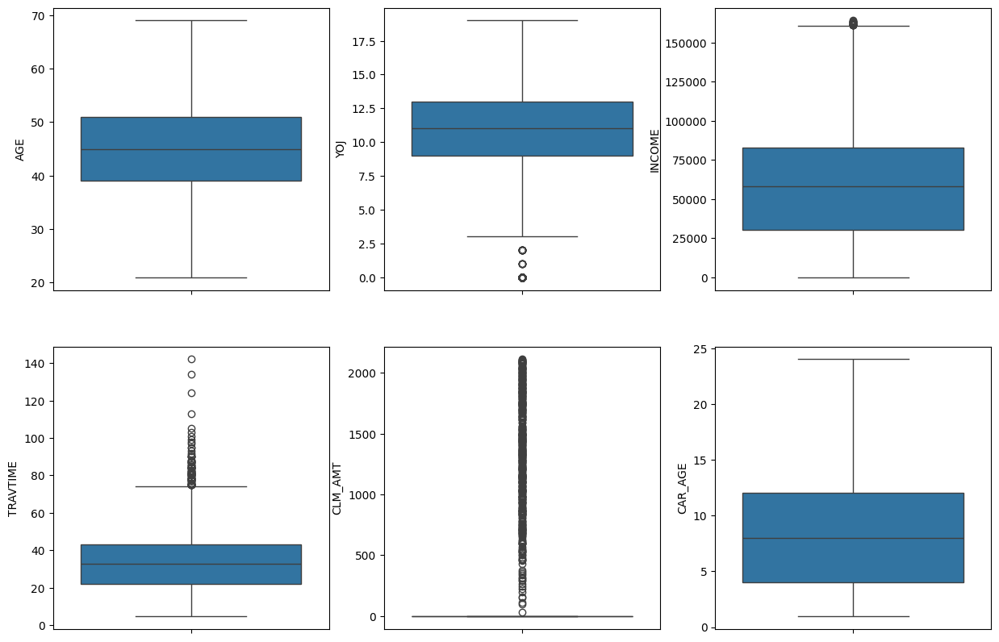

In [ ]:
plt.figure(figsize=(10,10))
plt.subplot(2,3,1)
sns.boxplot(df["AGE"])
plt.subplot(2,3,2)
sns.boxplot(df["YOJ"])
plt.subplot(2,3,3)
sns.boxplot(df["INCOME"])
plt.subplot(2,3,4)
sns.boxplot(df["TRAVTIME"])
plt.subplot(2,3,5)
sns.boxplot(df["CLM_AMT"])
plt.subplot(2,3,6)
sns.boxplot(df["CAR_AGE"])
plt.show()

[]

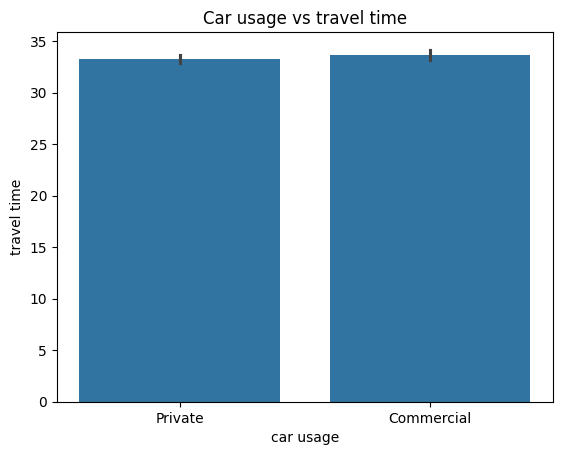

In [ ]:
sns.barplot(y="TRAVTIME",x="CAR_USE",data=df)
plt.title("Car usage vs travel time")
plt.xlabel("car usage")
plt.ylabel("travel time")
plt.plot()

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 10294 entries, 0 to 10301
Data columns (total 27 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   ID          10294 non-null  int64 
 1   KIDSDRIV    10294 non-null  int64 
 2   AGE         10294 non-null  int64 
 3   HOMEKIDS    10294 non-null  int64 
 4   YOJ         10294 non-null  int64 
 5   INCOME      10294 non-null  int64 
 6   PARENT1     10294 non-null  object
 7   HOME_VAL    10294 non-null  int64 
 8   MSTATUS     10294 non-null  object
 9   GENDER      10294 non-null  object
 10  EDUCATION   10294 non-null  object
 11  OCCUPATION  10294 non-null  object
 12  TRAVTIME    10294 non-null  int64 
 13  CAR_USE     10294 non-null  object
 14  TIF         10294 non-null  int64 
 15  CAR_TYPE    10294 non-null  object
 16  RED_CAR     10294 non-null  object
 17  OLDCLAIM    10294 non-null  int64 
 18  CLM_FREQ    10294 non-null  int64 
 19  REVOKED     10294 non-null  object
 20  MVR_PTS    

[]

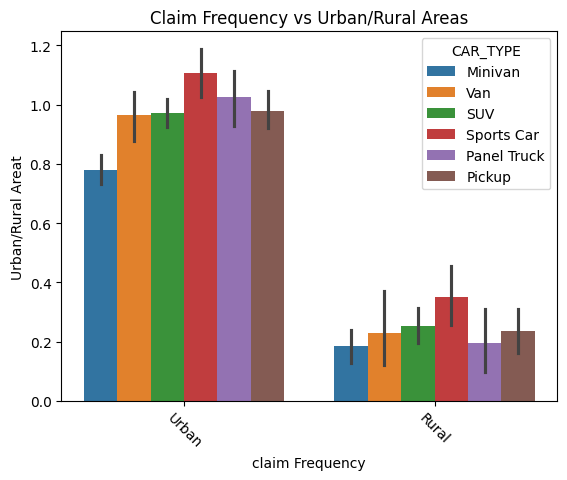

In [ ]:
sns.barplot(y="CLM_FREQ",x="URBANICITY",hue="CAR_TYPE",data=df)
plt.title("Claim Frequency vs Urban/Rural Areas")
plt.xlabel("claim Frequency")
plt.ylabel("Urban/Rural Areat")
plt.xticks(rotation=-45)
plt.plot()



*   Majority of Accidents are happening in Urban Areas
*   In Both Rural and Urban Areas, Majority of Accidents are with Sports Cars, With Least by Minivan






[]

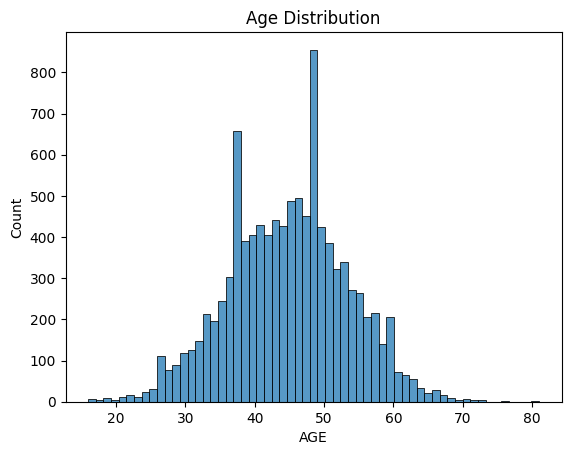

In [ ]:
sns.histplot(x="AGE",data=df)
plt.title("Age Distribution")

plt.plot()

# Data Encoding

In [ ]:
df.info()
df.dtypes.value_counts()

In [ ]:
df['PARENT1']=pd.get_dummies(df['PARENT1'],drop_first=True)
df['MSTATUS']=pd.get_dummies(df['MSTATUS'],drop_first=True)
df['GENDER']=pd.get_dummies(df['GENDER'],drop_first=True)
df['CAR_USE'] = pd.get_dummies(df['CAR_USE'],drop_first= True)
df["REVOKED"]=pd.get_dummies(df["REVOKED"],drop_first=True)
df['RED_CAR']=pd.get_dummies(df['RED_CAR'],drop_first=True)
df["URBANICITY"]=pd.get_dummies(df["URBANICITY"],drop_first=True)



In [ ]:
df.dtypes.value_counts()

In [ ]:
education = {'PhD':4, 'High School': 1, 'Bachelors': 2, 'Below Matriculation': 0,'Masters':3}
df['EDUCATION'] = df['EDUCATION'].map(education)

In [ ]:
df['OCCUPATION'] = le.fit_transform(df['OCCUPATION'])
df["CAR_TYPE"]= le.fit_transform(df["CAR_TYPE"])

df.info()

In [ ]:
df.info()

New Dataset

In [ ]:
df2.drop(columns=["Route"],axis=1,inplace=True)

In [ ]:
df2.info()

In [ ]:
df2.drop_duplicates(inplace=True)

In [ ]:
df2.info()

In [ ]:
df2.head()

In [ ]:
df2['Total_Stops'].unique()

In [ ]:
df2.isnull().sum()

In [ ]:
df2.dropna(axis=0,inplace=True)

In [ ]:
df2.isnull().sum()

In [ ]:
df2.info()

In [ ]:
age=[23,24,32,45,12,43,67,45,32,56,32,120]

In [ ]:
np.mean(age)

44.25

In [ ]:
np.var(age)

729.0208333333334

In [ ]:
np.std(age)

27.000385799712813

In [ ]:
#mean = 4, sd=1

In [ ]:
mean=100
sd=15

zscore=(85-mean)/sd
zscore

-1.0

In [ ]:
15.87

In [ ]:
#1

sd=10
mean=250
zscore=(240-mean)/sd
zscore

-1.0

In [ ]:
#2

sd=12
mean=260
zscore=(245-mean)/sd
zscore

-1.25

Q. On the quant test of CAT Exam the standard deviation is 100. A sample of 25 test takers has a mean of 520 score. Construct a Confidence Interval about the mean

In [ ]:
SD= 100
n=25
mean=520
CL=95

In [ ]:
CIU=520+1.96*100/np.sqrt(25)
CIL=520-1.96*100/np.sqrt(25)
print(CIL,CIU)

480.8 559.2


In [ ]:
1-0.98


0.020000000000000018

in a population the average IQ = 100, with a s.d of 15, researchers want to test a new medication to see if their is a positive or a negative effect oj the intelligenge, or no effect, as sample of 30 participants who have taken the medication has a mean IQ=140, did the medication affectthe intelligence ?

In [ ]:
z=(140-100)/15*np.sqrt(30)
z

14.605934866804429

the average Height of all residents in a city is 168 cm, with S.D of 3.9, a doctor believes the mean to be different, he measures the height of 36 individuals and found the average height to be 169.5 cm

1. State Null Hypotheses, Alternate Hypothesis
2. At 95% C.L, is there enough evidence to reject the null hypothesis

In [ ]:
Population_mean=168
SD=3.9
n=36
mean=169.5
CL=95

In [ ]:
# Null Hypothesis = The Average Height is 168 CM
# Alternate Hypothesis = Average Height != 168 CM

In [ ]:
# TEST - ZTEST

In [ ]:
zstats = (mean-Population_mean)/(SD/np.sqrt(n))
zstats

2.3076923076923075

In [ ]:
z score = 1.96

on the quant test of CAT Exam the standard deviation is 100. A sample of 25 test takers has a mean of 520 score. Construct a Confidence Interval about the mean